<h1 align="center"> Decision Trees on Donors Choose dataset</h1> 


### Importing Libraries

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import math as m
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import Normalizer
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from tqdm import tqdm

import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rajus\AppData\Roaming\nltk_data...


###  Importing Dataset

In [2]:
data = pd.read_csv('preprocessed_data.csv')

In [3]:
data.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


In [4]:
negative = []
positive = []
neutral = []
compound = []

def update_sentiments(values):
    negative.append(values["neg"])    
    positive.append(values["pos"])
    neutral.append(values["neu"])
    compound.append(values["compound"])

In [5]:
from tqdm import tqdm
for essay in tqdm(data["essay"]):
    update_sentiments(sid.polarity_scores(essay))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 109248/109248 [02:50<00:00, 642.39it/s]


In [6]:
data["neg"] = negative
data["pos"] = positive
data["neu"] = neutral        # adding new features to dataset based on  Sentiment Intensity Analyzer
data["compound"] = compound

In [7]:
data.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,0.013,0.205,0.783,0.9867


###   Splitting Data Into Train And Cross Validation(or test): Stratified Sampling

In [8]:
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y,random_state=42) 

In [10]:
print("Total data points in Train Dataset =",len(y_train))
print("Total data points in Test Dataset =",len(y_test))

Total data points in Train Dataset = 73196
Total data points in Test Dataset = 36052


###  Make Data Model Ready: Encoding Eassay(text feature)


####  TFIDF Vectorizer

In [11]:
tfidfvectorizer = TfidfVectorizer(min_df=10,max_features=5000)
text_tfidf = tfidfvectorizer.fit(X_train['essay'].values) #fitting

X_train_essay_tfidf =tfidfvectorizer.transform(X_train['essay'].values) 
X_test_essay_tfidf =tfidfvectorizer.transform(X_test['essay'].values)   # transform

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_test_essay_tfidf.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 5000) (73196,)
(36052, 5000) (36052,)


####  TFIDF W2V

In [12]:
import pickle
with open (r'glove_vectors', "rb") as f:
    model = pickle.load(f)
    glove_words = set(model.keys())

In [13]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train["essay"]) # we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [14]:
#TFIDF W2V for train dataset
from tqdm import tqdm
import numpy as np
X_train_tfidf_w2v = []  # the tfidf-w2v for each essay is stored in this list
for sentence in tqdm(X_train["essay"]):
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) 
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_train_tfidf_w2v.append(vector)
X_train_tfidf_w2v=np.array(X_train_tfidf_w2v)    

print("After vectorizations")
print(X_train_tfidf_w2v.shape, y_train.shape)
print("="*40)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 73196/73196 [01:35<00:00, 763.86it/s]

After vectorizations
(73196, 300) (73196,)


In [15]:
#TFIDF W2V for test dataset
from tqdm import tqdm
import numpy as np
X_test_tfidf_w2v = []  # the tfidf-w2v for each essay is stored in this list
for sentence in tqdm(X_test["essay"]):
    vector = np.zeros(300) 
    tf_idf_weight =0; 
    for word in sentence.split(): 
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] 
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) 
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_test_tfidf_w2v.append(vector)
X_test_tfidf_w2v=np.array(X_test_tfidf_w2v)    

print("After vectorizations")
print(X_test_tfidf_w2v.shape, y_test.shape)
print("="*40)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 36052/36052 [00:49<00:00, 731.43it/s]


After vectorizations
(36052, 300) (36052,)


###  Make Data Model Ready: Categorical Features

####  Encoding Categorical Features: School State

In [16]:
vectorizer_state = CountVectorizer()
vectorizer_state.fit(X_train['school_state'].values) # fitting

X_train_state_ohe = vectorizer_state.transform(X_train['school_state'].values)
X_test_state_ohe = vectorizer_state.transform(X_test['school_state'].values) #transform
print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_test_state_ohe.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 51) (73196,)
(36052, 51) (36052,)


#### Encoding Categorical Features: teacher_prefix

In [17]:
vectorizer_prefix= CountVectorizer()
vectorizer_prefix.fit(X_train['teacher_prefix'].values) # fitting 

X_train_teacher_ohe = vectorizer_prefix.transform(X_train['teacher_prefix'].values) #transform
X_test_teacher_ohe = vectorizer_prefix.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 5) (73196,)
(36052, 5) (36052,)


####   Encoding Categorical Features: project_grade_category

In [18]:
vectorizer_grade = CountVectorizer()
vectorizer_grade.fit(X_train['project_grade_category'].values) # fitting 

X_train_grade_ohe = vectorizer_grade.transform(X_train['project_grade_category'].values)
X_test_grade_ohe = vectorizer_grade.transform(X_test['project_grade_category'].values) #transform


print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 4) (73196,)
(36052, 4) (36052,)


####  Encoding Categorical Features: clean_categories	

In [19]:
vectorizer_category = CountVectorizer()
vectorizer_category.fit(X_train['clean_categories'].values) # fitting 

X_train_category_ohe = vectorizer_category.transform(X_train['clean_categories'].values)#transform
X_test_category_ohe = vectorizer_category.transform(X_test['clean_categories'].values)

print("After vectorizations")
print(X_train_category_ohe.shape, y_train.shape)
print(X_test_category_ohe.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 9) (73196,)
(36052, 9) (36052,)


#####  Encoding Categorical Features: 	clean_subcategories

In [20]:
vectorizer_sub = CountVectorizer()
vectorizer_sub.fit(X_train['clean_subcategories'].values) # fitting

X_train_subcategory_ohe = vectorizer_sub.transform(X_train['clean_subcategories'].values)  #transform
X_test_subcategory_ohe = vectorizer_sub.transform(X_test['clean_subcategories'].values)

print("After vectorizations")
print(X_train_subcategory_ohe.shape, y_train.shape)
print(X_test_subcategory_ohe.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 30) (73196,)
(36052, 30) (36052,)


###  Encoding Numerical Features

#### Encoding Numerical Feature :price

In [21]:
normalizer = Normalizer()
normalizer.fit(X_train['price'].values.reshape(1,-1)) #fitting

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(1,-1))  #transform
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(1,-1))

X_train_price_norm =X_train_price_norm.reshape(-1,1)
X_test_price_norm=X_test_price_norm.reshape(-1,1)

print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


####  Encoding Numerical Features:teacher_number_of_previously_posted_projects	

In [22]:
normalizer = Normalizer()
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1)) #fitting
X_train_submission_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))  #transform
X_test_submission_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

X_train_submission_norm =X_train_submission_norm .reshape(-1,1)
X_test_submission_norm=X_test_submission_norm.reshape(-1,1)

print("After vectorizations")
print(X_train_submission_norm.shape, y_train.shape)
print(X_test_submission_norm.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


####  Encoding Numerical Features:neg

In [23]:
normalizer = Normalizer()
normalizer.fit(X_train['neg'].values.reshape(1,-1)) #fitting

X_train_neg_norm = normalizer.transform(X_train['neg'].values.reshape(1,-1))  #transform
X_test_neg_norm = normalizer.transform(X_test['neg'].values.reshape(1,-1))

X_train_neg_norm =X_train_neg_norm .reshape(-1,1)
X_test_neg_norm=X_test_neg_norm.reshape(-1,1)

print("After vectorizations")
print(X_train_neg_norm.shape, y_train.shape)
print(X_test_neg_norm.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


####  Encoding Numerical Features:pos

In [24]:
normalizer = Normalizer()
normalizer.fit(X_train['pos'].values.reshape(1,-1)) #fitting

X_train_pos_norm = normalizer.transform(X_train['pos'].values.reshape(1,-1))  #transform
X_test_pos_norm = normalizer.transform(X_test['pos'].values.reshape(1,-1))

X_train_pos_norm =X_train_pos_norm .reshape(-1,1)
X_test_pos_norm=X_test_neg_norm.reshape(-1,1)

print("After vectorizations")
print(X_train_pos_norm.shape, y_train.shape)
print(X_test_pos_norm.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


####  Encoding Numerical Features:neu

In [25]:
normalizer = Normalizer()
normalizer.fit(X_train['neu'].values.reshape(1,-1)) #fitting
X_train_neu_norm = normalizer.transform(X_train['neu'].values.reshape(1,-1))
X_test_neu_norm = normalizer.transform(X_test['neu'].values.reshape(1,-1))

X_train_neu_norm =X_train_neu_norm .reshape(-1,1)
X_test_neu_norm=X_test_neu_norm.reshape(-1,1)

print("After vectorizations")
print(X_train_neu_norm.shape, y_train.shape)
print(X_test_neu_norm.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


####  Encoding Numerical Features:compound

In [26]:
normalizer = Normalizer()
normalizer.fit(X_train['compound'].values.reshape(1,-1)) #fitting

X_train_compound_norm = normalizer.transform(X_train['compound'].values.reshape(1,-1))  #transform
X_test_compound_norm = normalizer.transform(X_test['compound'].values.reshape(1,-1))

X_train_compound_norm =X_train_compound_norm .reshape(-1,1)
X_test_compound_norm=X_test_neu_norm.reshape(-1,1)

print("After vectorizations")
print(X_train_compound_norm.shape, y_train.shape)
print(X_test_compound_norm.shape, y_test.shape)
print("="*40)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


###   Concatinating All The Features

##### SET-1

* Set 1: categorical, numerical features + preprocessed_eassay (TFIDF)

In [27]:
from scipy.sparse import hstack
X_tr_set_one = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_price_norm,X_train_category_ohe,X_train_subcategory_ohe,X_train_submission_norm,X_train_neg_norm ,X_train_pos_norm,X_train_neu_norm,X_train_compound_norm    )).tocsr()
X_te_set_one = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe, X_test_price_norm,X_test_category_ohe,X_test_subcategory_ohe,X_test_submission_norm,X_test_neg_norm.shape,X_test_pos_norm.shape,X_test_neu_norm.shape,X_test_compound_norm.shape)).tocsr()

In [28]:
print("SHAPE OF TRAIN AND TEST AFTER STACKING")
print(X_tr_set_one.shape)
print(X_te_set_one.shape)

SHAPE OF TRAIN AND TEST AFTER STACKING
(73196, 5105)
(36052, 5105)


##### SET-2

* Set 2: categorical, numerical features + preprocessed_eassay (TFIDF W2V)

In [29]:
from scipy.sparse import hstack
X_tr_set_two = hstack((X_train_tfidf_w2v, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_price_norm,X_train_category_ohe,X_train_subcategory_ohe,X_train_submission_norm,X_train_neg_norm ,X_train_pos_norm,X_train_neu_norm,X_train_compound_norm    )).tocsr()
X_te_set_two = hstack((X_test_tfidf_w2v, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe, X_test_price_norm,X_test_category_ohe,X_test_subcategory_ohe,X_test_submission_norm,X_test_neg_norm.shape,X_test_pos_norm.shape,X_test_neu_norm.shape,X_test_compound_norm.shape)).tocsr()

In [30]:
print("SHAPE OF TRAIN AND TEST AFTER STACKING")
print(X_tr_set_two.shape)
print(X_te_set_two.shape)

SHAPE OF TRAIN AND TEST AFTER STACKING
(73196, 405)
(36052, 405)


<h1 align="center"> TASK - 1</h1> 

---------------------------------------------------------------------------------------------------------------------------   

###  DECISION TREE USING GRID SEARCH CROSS VALIDATION (SET - 1)

In [31]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_tr_set_one,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'ma

In [32]:
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [33]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.6500185624618704
Best Hyper parameters:  {'max_depth': 10, 'min_samples_split': 500}


#### Plotting Hyperparameter v/s Auc

In [34]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [35]:
from itertools import repeat
max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1= max_depth
y1= min_samples_split
z1= train_auc
z2= cv_auc

In [36]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### Roc Plot Of Train And Test Data


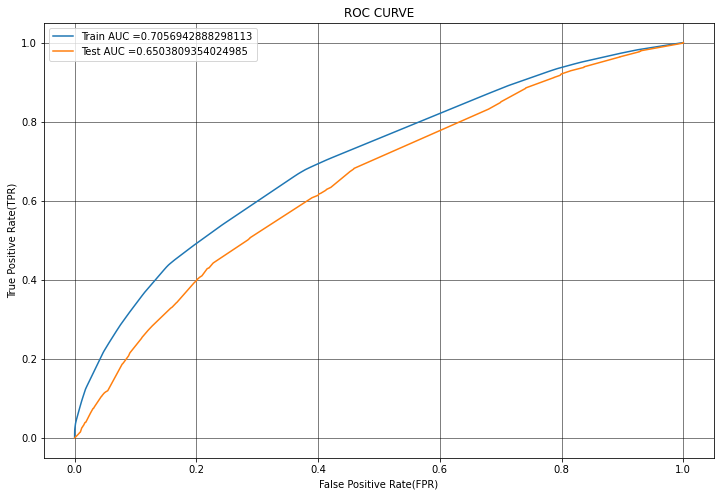

In [37]:
model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_tr_set_one,y_train)
y_train_probs = clf.predict_proba(X_tr_set_one)[:,1] # converting train and test output into probability
y_test_probs= clf.predict_proba(X_te_set_one )[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

### Confusion Matrix

In [38]:
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

#### Train Data

the maximum value of tpr*(1-fpr) 0.4230474778616526 for threshold 0.509
CONFUSION MATRIX OF TRAIN DATA


[[ 7106  3977]
 [21130 40983]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

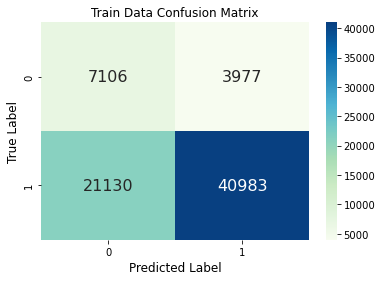

In [39]:
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))  # https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)


####  Test Data

the maximum value of tpr*(1-fpr) 0.3707905097521341 for threshold 0.509
CONFUSION MATRIX OF TEST DATA


[[ 3330  2129]
 [11997 18596]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

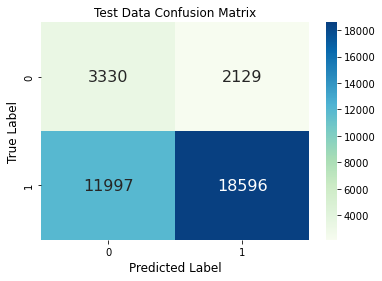

In [40]:
best_t = find_best_threshold(te_thresholds, test_fpr, test_tpr)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))
  
print("CONFUSION MATRIX OF TEST DATA")
print('\n')
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

### Getting All the False Positive Data Points

In [41]:
predict=predict_with_best_t(y_test_probs,best_t)

In [42]:
fpi = []
for i in range(len(y_test)):
    if(y_test[i]==0) & (predict[i] == 1):
        fpi.append(i) # GETTING THE ALL FALSE POSITIVE INDICES
len(fpi)

2129

In [43]:
import pandas as pd
cols = X_test.columns
X_test_false_Positive = pd.DataFrame(columns=cols) # MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)   

(2129, 12)


In [44]:
X_test_false_Positive.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
69487,sc,mrs,grades_3_5,10,literacy_language math_science,literacy mathematics,many students english language learners hard w...,228.89,0.039,0.242,0.719,0.9794


#### wordcloud Of Essay Text For False Positive Dataset


In [45]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for word in X_test_false_Positive['essay']:
    val = str(word)                #https://www.geeksforgeeks.org/generating-word-cloud-python/
    tokens = val.split()
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    for words in tokens:
        comment_words = comment_words + words + ' '

In [46]:
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

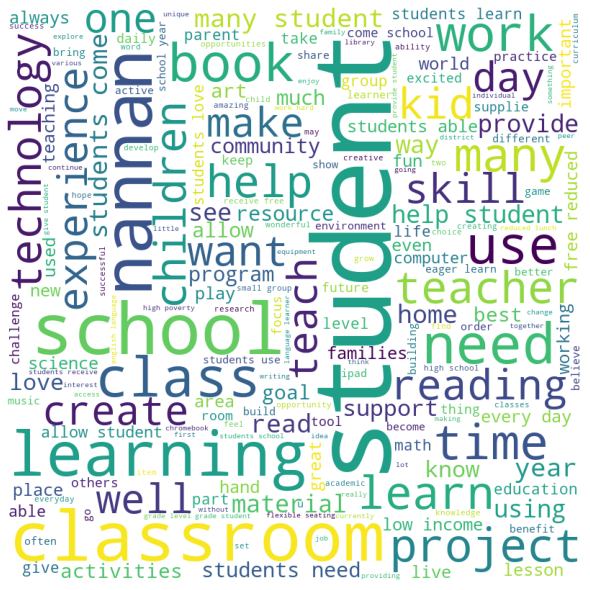

In [47]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

#### Box Plot With The Price Of These False Positive Data Points

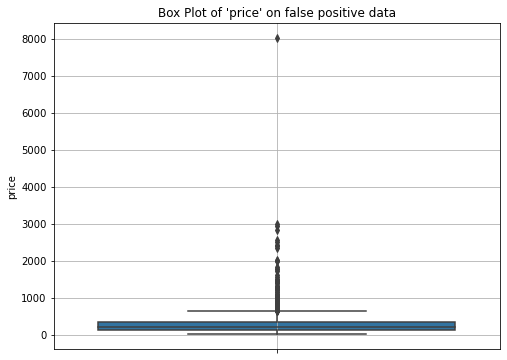

In [79]:
plt.figure(figsize=(8,6))
sns.boxplot(y='price',data=X_test_false_Positive,orient="v").set_title("Box Plot of 'price' on false positive data")
plt.grid()

#### Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points

[8.66134335e-01 7.60920620e-02 2.91216534e-02 1.17426022e-02
 8.45467356e-03 1.87881635e-03 3.28792860e-03 1.87881635e-03
 4.69704086e-04 9.39408173e-04]
[  0.   24.8  49.6  74.4  99.2 124.  148.8 173.6 198.4 223.2 248. ]


Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

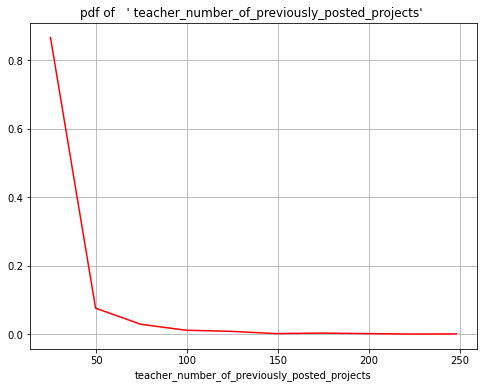

In [58]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')


###  DECISION TREE USING GRID SEARCH CROSS VALIDATION (SET - 2)

In [59]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_tr_set_two,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'ma

In [60]:
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [61]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.618318785155252
Best Hyper parameters:  {'max_depth': 5, 'min_samples_split': 500}


#### Plotting Hyperparameter v/s Auc

In [62]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [63]:
from itertools import repeat
max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1= max_depth
y1= min_samples_split
z1= train_auc
z2= cv_auc

In [64]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### Roc Plot Of Train And Test Data

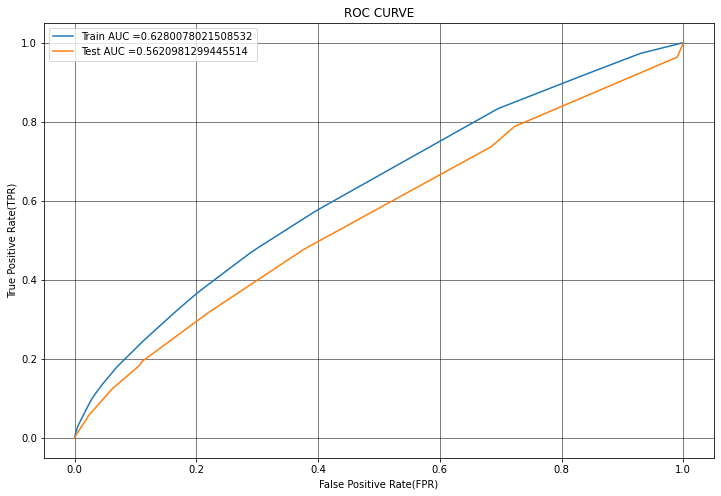

In [65]:
model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_tr_set_two,y_train)
y_train_probs = clf.predict_proba(X_tr_set_two)[:,1] # converting train and test output into probability
y_test_probs= clf.predict_proba(X_te_set_two )[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

### Confusion Matrix

In [66]:
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

#### Train Data

the maximum value of tpr*(1-fpr) 0.34677780669207536 for threshold 0.495
CONFUSION MATRIX OF TRAIN DATA


[[ 6720  4363]
 [26589 35524]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

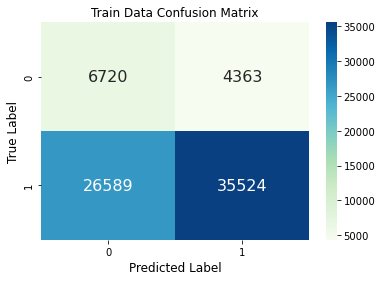

In [67]:
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))  # https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)

####  Test Data

the maximum value of tpr*(1-fpr) 0.2975590625330394 for threshold 0.466
CONFUSION MATRIX OF TEST DATA


[[ 3407  2052]
 [16007 14586]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

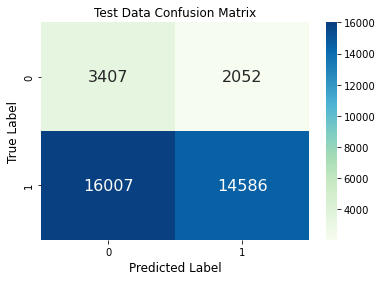

In [68]:
best_t = find_best_threshold(te_thresholds, test_fpr, test_tpr)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))
  
print("CONFUSION MATRIX OF TEST DATA")
print('\n')
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

### Getting All the False Positive Data Points

In [69]:
predict=predict_with_best_t(y_test_probs,best_t)

In [70]:
fpi = []
for i in range(len(y_test)):
    if(y_test[i]==0) & (predict[i] == 1): #GETTING THE FALSE POSITIVE INDICES
        fpi.append(i)
len(fpi)

2052

In [71]:
import pandas as pd
cols = X_test.columns
X_test_false_Positive = pd.DataFrame(columns=cols) # MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)   

(2052, 12)


In [72]:
X_test_false_Positive.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
69487,sc,mrs,grades_3_5,10,literacy_language math_science,literacy mathematics,many students english language learners hard w...,228.89,0.039,0.242,0.719,0.9794


#### wordcloud Of Essay Text For False Positive Dataset

In [73]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for word in X_test_false_Positive['essay']:
    val = str(word)                #https://www.geeksforgeeks.org/generating-word-cloud-python/
    tokens = val.split()
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    for words in tokens:
        comment_words = comment_words + words + ' '

In [74]:
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

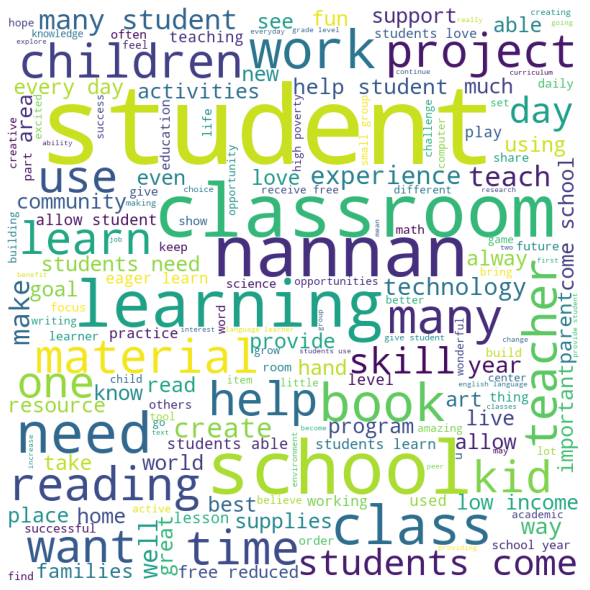

In [75]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

#### Box Plot With The Price Of These False Positive Data Points

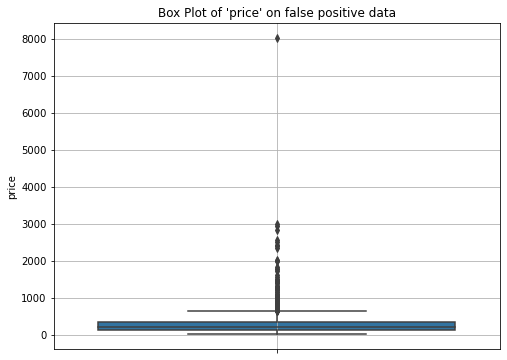

In [78]:
plt.figure(figsize=(8,6))
sns.boxplot(y='price',data=X_test_false_Positive,orient="v").set_title("Box Plot of 'price' on false positive data")
plt.grid()

#### Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points

[0.82261209 0.11208577 0.03118908 0.01169591 0.01072125 0.00389864
 0.00389864 0.00194932 0.00097466 0.00097466]
[  0.   24.8  49.6  74.4  99.2 124.  148.8 173.6 198.4 223.2 248. ]


Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

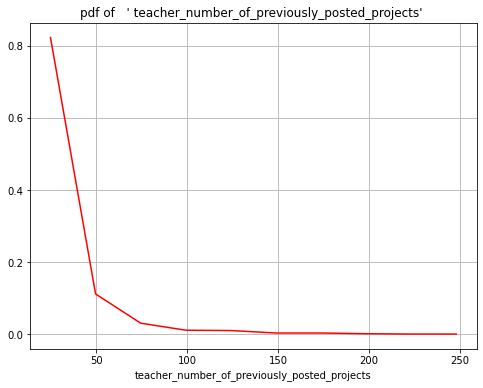

In [80]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')


<h1 align="center"> TASK - 2</h1> 

----------------------------------------------------------------------------------------------------------------------------

###  Selecting All The Features Which Are Having Non-Zero Feature Importance(Set -1)

In [74]:
from scipy.sparse import hstack
X_tr_set_one = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_price_norm,X_train_category_ohe,X_train_subcategory_ohe,X_train_submission_norm,X_train_neg_norm ,X_train_pos_norm,X_train_neu_norm,X_train_compound_norm    )).tocsr()
X_te_set_one = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe, X_test_price_norm,X_test_category_ohe,X_test_subcategory_ohe,X_test_submission_norm,X_test_neg_norm.shape,X_test_pos_norm.shape,X_test_neu_norm.shape,X_test_compound_norm.shape)).tocsr()

In [75]:
print("SHAPE OF TRAIN AND TEST AFTER STACKING")
print(X_tr_set_one.shape)
print(X_te_set_one .shape)

SHAPE OF TRAIN AND TEST AFTER STACKING
(73196, 5105)
(36052, 5105)


In [76]:
clf_fea= DecisionTreeClassifier(class_weight='balanced',max_depth=None,min_samples_split=500) 

In [77]:
clf_fea.fit(X_tr_set_one,y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [78]:
features = clf_fea.feature_importances_
len(features)

5105

In [79]:
non_zero_features=[]
for i in range(len(features)):
    if features[i]>0:             # FILTERING THE NON ZERO FEATURE IMPORTANT FEATURE INDICES
        non_zero_features.append(i)

In [80]:
print("NUMBER OF NON ZERO IMPORTANT FEATURES =" ,len(non_zero_features))

NUMBER OF NON ZERO IMPORTANT FEATURES = 1041


In [81]:
X_tr_fea=X_tr_set_one[:,non_zero_features]
X_te_fea=X_te_set_one[:,non_zero_features]   # CREATING NON ZERO FEATURE IMPORTANT DATASET

In [82]:
print("SHAPE OF TRAIN AND TEST OF NON ZERO IMPORTANT FEATURES")
print(X_tr_fea.shape)
print(X_te_fea .shape)

SHAPE OF TRAIN AND TEST OF NON ZERO IMPORTANT FEATURES
(73196, 1041)
(36052, 1041)


In [83]:
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_tr_fea,y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [1, 5, 10, 50], 'min_samples_split': [5, 10, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=0)

In [84]:
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [85]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.6526662247828293
Best Hyper parameters:  {'max_depth': 10, 'min_samples_split': 500}


#### Plotting Hyperparameter v/s Auc

In [87]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [88]:
from itertools import repeat
max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1= max_depth
y1= min_samples_split
z1= train_auc
z2= cv_auc

In [89]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### Roc Plot Of Train And Test Data

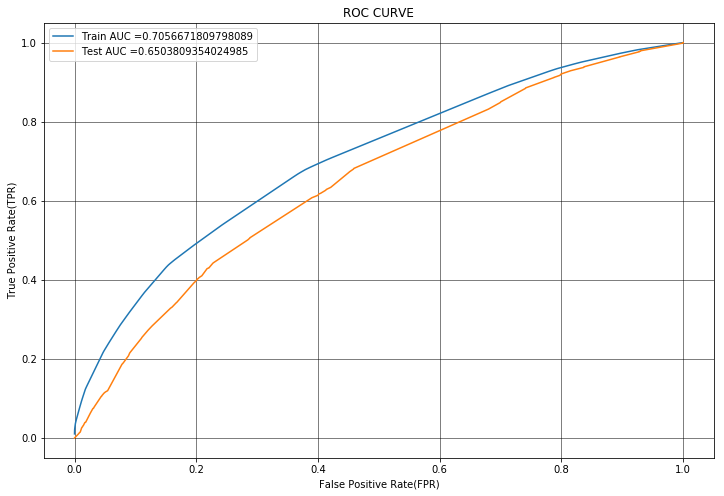

In [91]:
model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_tr_fea,y_train)
y_train_probs = clf.predict_proba(X_tr_fea)[:,1] # converting train and test output into probability
y_test_probs= clf.predict_proba(X_te_fea )[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

### Confusion Matrix

In [94]:
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

#### Train Data

the maximum value of tpr*(1-fpr) 0.42297762296154395 for threshold 0.509
CONFUSION MATRIX OF TRAIN DATA


[[ 7105  3978]
 [21131 40982]]


Text(0.5,1,'Train Data Confusion Matrix')

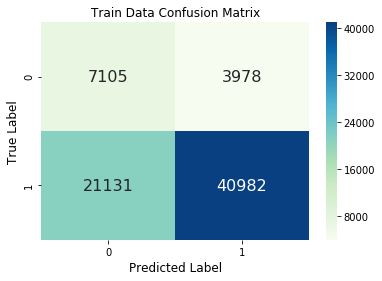

In [95]:
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))  # https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)

#### Test Data

the maximum value of tpr*(1-fpr) 0.3707905097521341 for threshold 0.509
CONFUSION MATRIX OF TEST DATA


[[ 3330  2129]
 [11997 18596]]


Text(0.5,1,'Test Data Confusion Matrix')

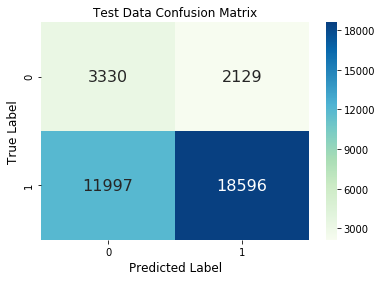

In [96]:
best_t = find_best_threshold(te_thresholds, test_fpr, test_tpr)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))
  
print("CONFUSION MATRIX OF TEST DATA")
print('\n')
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

### Getting All the False Positive Data Points

In [97]:
predict=predict_with_best_t(y_test_probs,best_t)

In [98]:
fpi = []
for i in range(len(y_test)):
    if(y_test[i]==0) & (predict[i] == 1):
        fpi.append(i)
len(fpi)

2129

In [99]:
import pandas as pd
cols = X_test.columns
X_test_false_Positive = pd.DataFrame(columns=cols) # MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)   

(2129, 12)


#### wordcloud Of Essay Text For False Positive Dataset

In [100]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for word in X_test_false_Positive['essay']:
    val = str(word)                #https://www.geeksforgeeks.org/generating-word-cloud-python/
    tokens = val.split()
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    for words in tokens:
        comment_words = comment_words + words + ' '

In [101]:
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

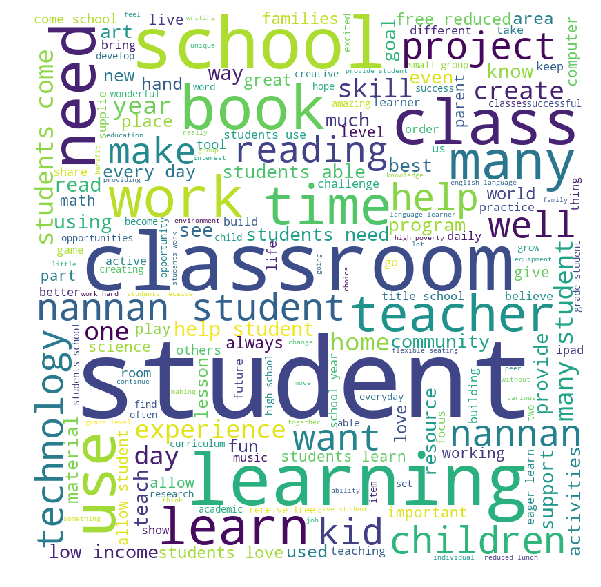

In [102]:
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

#### Box Plot With The Price Of These False Positive Data Points

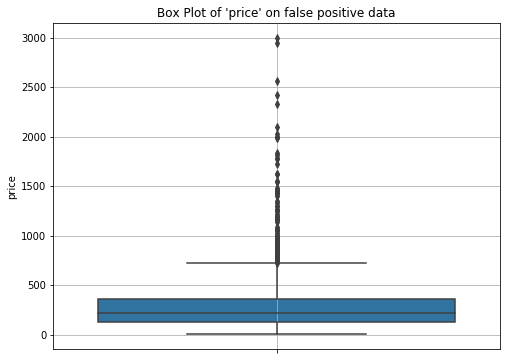

In [103]:
plt.figure(figsize=(8,6))
sns.boxplot('price',data=X_test_false_Positive,orient="v").set_title("Box Plot of 'price' on false positive data")
plt.grid()

#### Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points

[8.66134335e-01 7.60920620e-02 2.91216534e-02 1.17426022e-02
 8.45467356e-03 1.87881635e-03 3.28792860e-03 1.87881635e-03
 4.69704086e-04 9.39408173e-04]
[  0.   24.8  49.6  74.4  99.2 124.  148.8 173.6 198.4 223.2 248. ]


Text(0.5,0,'teacher_number_of_previously_posted_projects')

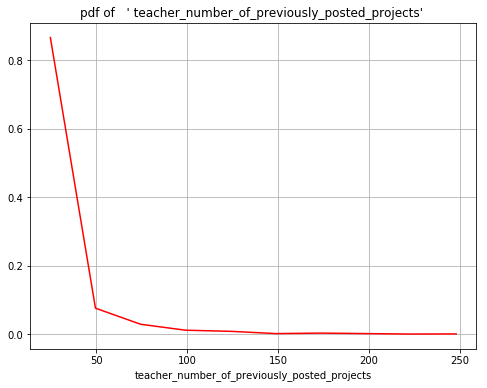

In [131]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')

## Summary

In [133]:
from prettytable import PrettyTable
from prettytable import ALL as ALL
table=PrettyTable(hrules=ALL)
table.field_names = [ "Sl.N0","Vectorizer", "Model", "Hyper Parameter", "Test-AUC"] # # http://zetcode.com/python/prettytable/
table.add_row([1,"TFIDF", "DECSION TREE", "max_depth =10 , min_samples_split=500", 0.65042])
table.add_row([2,"TFIDF W2V", "DECSION TREE"," max_depth =5 , min_samples_split=500", 0.56212])
table.add_row([3,"TFIDF NON ZERO FEATURE IMPORTANCE", "DECSION TREE", "max_depth =10 , min_samples_split=500", 0.650380])
print(table)

+-------+-----------------------------------+--------------+---------------------------------------+----------+
| Sl.N0 |             Vectorizer            |    Model     |            Hyper Parameter            | Test-AUC |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   1   |               TFIDF               | DECSION TREE | max_depth =10 , min_samples_split=500 | 0.65042  |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   2   |             TFIDF W2V             | DECSION TREE |  max_depth =5 , min_samples_split=500 | 0.56212  |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   3   | TFIDF NON ZERO FEATURE IMPORTANCE | DECSION TREE | max_depth =10 , min_samples_split=500 | 0.65038  |
+-------+-----------------------------------+--------------+---------------------------------------+----